# Import and installing

In [2]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.insert(0,'/home/cane/Documents/yoseflab/can/resolVI')
from scvi.external import RESOLVI

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import sys
import scvi
from scvi.model import CondSCVI, DestVI
import anndata
import gc
import parc
import seaborn as sns
from scipy.sparse import csr_matrix as csr

2024-07-08 17:36:36.744348: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [4]:
sns.reset_orig()
sc.settings._vector_friendly = True
# p9.theme_set(p9.theme_classic)
plt.rcParams["svg.fonttype"] = "none"
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["savefig.transparent"] = True
plt.rcParams["figure.figsize"] = (4, 4)

plt.rcParams["axes.titlesize"] = 15
plt.rcParams["axes.titleweight"] = 500
plt.rcParams["axes.titlepad"] = 8.0
plt.rcParams["axes.labelsize"] = 14
plt.rcParams["axes.labelweight"] = 500
plt.rcParams["axes.linewidth"] = 1.2
plt.rcParams["axes.labelpad"] = 6.0
plt.rcParams["axes.spines.top"] = False
plt.rcParams["axes.spines.right"] = False

plt.rcParams["font.size"] = 11
# plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica', "Computer Modern Sans Serif", "DejaVU Sans"]
plt.rcParams['font.weight'] = 500

plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['xtick.minor.size'] = 1.375
plt.rcParams['xtick.major.size'] = 2.75
plt.rcParams['xtick.major.pad'] = 2
plt.rcParams['xtick.minor.pad'] = 2

plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['ytick.minor.size'] = 1.375
plt.rcParams['ytick.major.size'] = 2.75
plt.rcParams['ytick.major.pad'] = 2
plt.rcParams['ytick.minor.pad'] = 2

plt.rcParams["legend.fontsize"] = 12
plt.rcParams['legend.handlelength'] = 1.4
plt.rcParams['legend.numpoints'] = 1
plt.rcParams['legend.scatterpoints'] = 3

plt.rcParams['lines.linewidth'] = 1.7
DPI = 300

In [5]:
import sys
sys.path.insert(0, '/home/cane/Documents/yoseflab/can/resolvi_eval_final2')

In [6]:
import _utils

## Annotate

In [7]:
proseg_concat = sc.read_h5ad('concat_all_proseg.h5ad')
sc.pp.subsample(proseg_concat, 0.5)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [8]:
proseg_concat

AnnData object with n_obs × n_vars = 5186482 × 550
    obs: 'transcript_id', 'x', 'y', 'z', 'observed_x', 'observed_y', 'observed_z', 'fov', 'probability', 'background', 'confusion', 'patient'
    obsm: 'X_spatial', 'spatial'
    layers: 'counts', 'counts_wo_bg', 'estimated_counts'

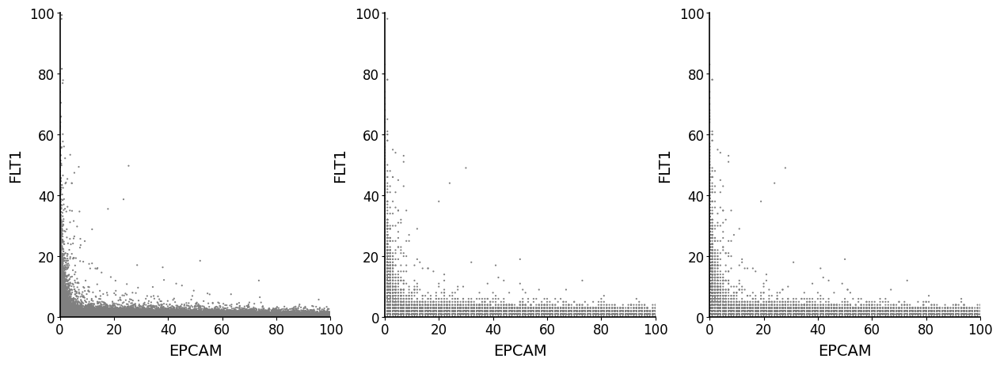

In [9]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
sc.pl.scatter(proseg_concat, x='EPCAM', y='FLT1', layers='estimated_counts', ax=ax[0], show=False, size=10)
sc.pl.scatter(proseg_concat, x='EPCAM', y='FLT1', layers='counts', ax=ax[1], show=False, size=10)
sc.pl.scatter(proseg_concat, x='EPCAM', y='FLT1', layers='counts_wo_bg', ax=ax[2], show=False, size=10)
# Set the limits
x_limits = [0, 100]
y_limits = [0, 100]

for a in ax:
    a.set_xlim(x_limits)
    a.set_ylim(y_limits)

In [10]:
proseg_concat = proseg_concat[proseg_concat.layers['counts_wo_bg'].sum(1)>30]
proseg_concat.layers['estimated_counts'].sum(1).min()

18.720558

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/cudf/utils/_numba.py:110: UserWarning: Using CUDA toolkit version (12, 5) with CUDA driver version (12, 4) requires minor version compatibility, which is not yet supported for CUDA driver versions 12.0 and above. It is likely that many cuDF operations will not work i

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


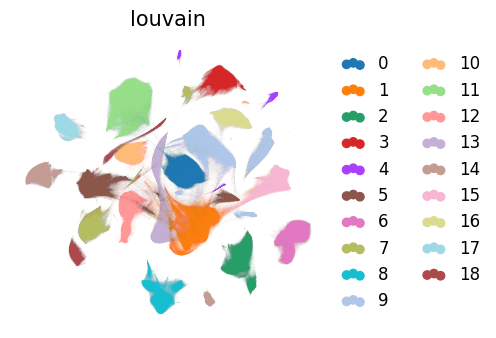

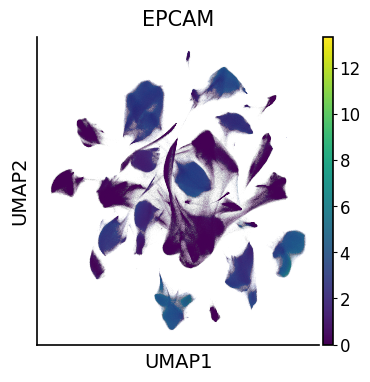

In [11]:
try:
    _utils.compute_umap_embedding(proseg_concat, representation_key="estimated_counts", show=True, key='estimated', n_neighbors=5)
except:
    sc.pl.umap(proseg_concat, color='EPCAM')

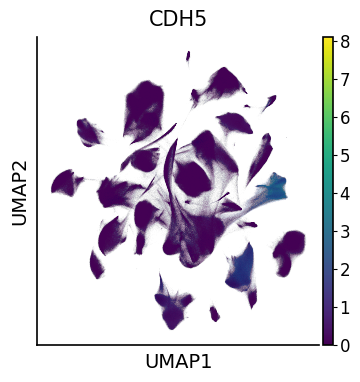

In [12]:
sc.pl.umap(proseg_concat, color='CDH5')

In [14]:
proseg_concat.write_h5ad('concat_subset_proseg_processed2.h5ad')

In [15]:
proseg_concat

AnnData object with n_obs × n_vars = 4688455 × 550
    obs: 'transcript_id', 'x', 'y', 'z', 'observed_x', 'observed_y', 'observed_z', 'fov', 'probability', 'background', 'confusion', 'patient', 'louvain'
    uns: 'pca', 'neighbors', 'umap', 'louvain', 'louvain_colors'
    obsm: 'X_spatial', 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'counts_wo_bg', 'estimated_counts'
    obsp: 'distances', 'connectivities'

In [16]:
proseg_concat.obs['tissue'] = proseg_concat.obs['patient'].str.split('CancerPatient').str[0].str.replace('Human', '')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


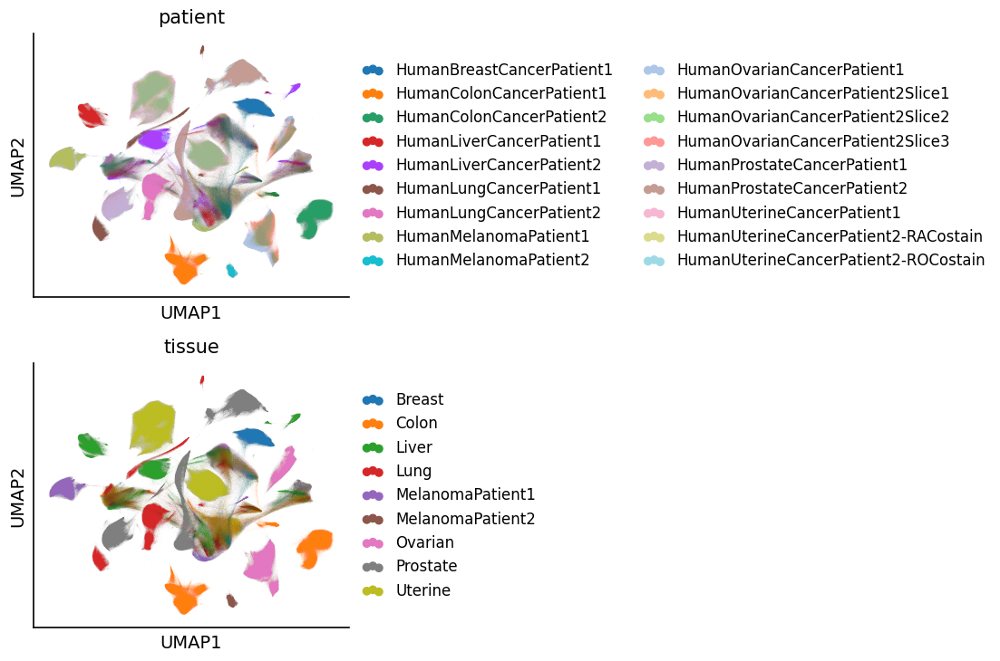

In [17]:
sc.pl.umap(proseg_concat, color=['patient', 'tissue'], ncols=1)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


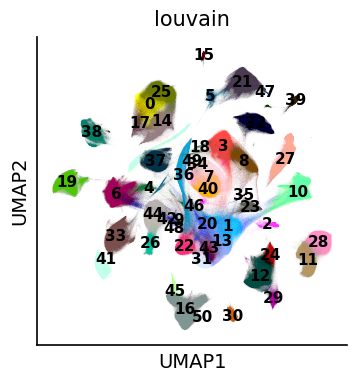

In [18]:
sc.tl.louvain(proseg_concat, resolution=2.0, flavor='rapids')
sc.pl.umap(proseg_concat, color='louvain', legend_loc='on data')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


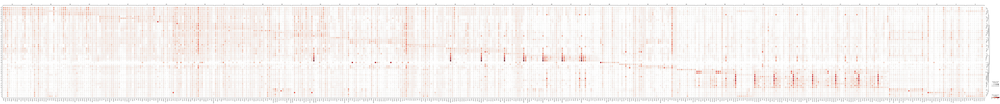

In [19]:
sc.tl.rank_genes_groups(proseg_concat, groupby='louvain')
sc.pl.rank_genes_groups_dotplot(proseg_concat)

In [20]:
for i in proseg_concat.obs['louvain'].unique():
    sub = sc.get.rank_genes_groups_df(proseg_concat, i).head(20)
    print('cluster', i, ':        ', ', '.join(sub['names']))

cluster 1 :         COL1A1, COL5A1, PDGFRB, MMP11, ZEB1, BMP1, ITGA1, COL4A1, ACTA2, CD248, PDGFRA, FAP, FN1, LRP1, ITGB1, CSF1, SNAI2, PDPN, WNT5A, TGFB1
cluster 44 :         TP63, SOX2, FOXM1, MCM2, LAMB3, EGFR, LGALS9, HLA-C, BST2, PKM, BIRC5, NFE2L2, LAMP3, EZH2, CHEK2, MSH6, CDK4, MKI67, BRCA1, WNT5A
cluster 22 :         COL5A1, PDGFRB, LRP1, FBLN1, COL1A1, PDGFRA, SFRP2, FGFR1, ELN, TBX3, FN1, ENG, FZD7, CD248, TGFB3, ITGA1, PRKCA, ZEB1, COL4A1, ANGPT1
cluster 37 :         SERPINA1, VTN, PROX1, FGFR3, GPX3, PRF1, ARG1, TGFBI, RORC, FN1, XBP1, ICOSLG, NEDD4, IL22, INSR, LRP1, BCL2L1, PRKCA, CXCL2, HAVCR2
cluster 23 :         XBP1, MZB1, POU2AF1, ICAM3, CD79A, FCRL5, PECAM1, CD27, HLA-B, PDK1, PIK3CG, IRF4, VSIR, TNFRSF17, CXCR4, ICAM2, CD79B, ITGA4, PTPRC, DERL3
cluster 39 :         SERPINA1, VTN, FN1, ARG1, PROX1, CD14, ATF3, CXCL2, PRF1, CD8B, RORC, SERPINE1, LRP1, EGR1, XBP1, ESCO2, CD160, PRTN3, HAVCR2, PTGDR2
cluster 17 :         VEGFA, BST2, YAP1, MUC1, CDH1, STAT6, ERBB3, H

In [30]:
cell_type_mapping = {
    1: "Myofibroblast",
    44: "Cancer Cell",
    22: "Myofibroblast",
    37: "Cancer Cell",
    23: "B Cell",
    39: "Cancer Cell",
    17: "Cancer Cell",
    16: "Cancer Cell",
    13: "Myofibroblast",
    4: "B Cell",
    41: "Cancer Cell",
    25: "Cancer Cell",
    26: "Cancer Cell",
    3: "Macrophage",
    33: "Cancer Cell",
    19: "Cancer Cell",
    32: "Cancer Cell",
    8: "Suppressive Macrophage",
    38: "Cancer Cell",
    21: "Cancer Cell",
    14: "Cancer Cell",
    2: "Intestinal Epithelial Cell",
    0: "Cancer Cell",
    7: "Cancer Cell",
    6: "T Cell",
    12: "Cancer Cell",
    31: "Myofibroblast",
    36: "Myofibroblast",
    11: "Cancer Cell",
    30: "Cancer Cell",
    43: "Myofibroblast",
    24: "Endothelial?",
    29: "Cancer Cell",
    40: "Cancer Cell",
    10: "Endothelial",
    28: "Cancer Cell",
    5: "Cancer Cell",
    27: "Myofibroblast",
    35: "Skin Epithelial Cell",
    9: "Doublet Tcell Fibroblast",
    20: "Myofibroblast",
    34: "Suppressive Macrophage",
    42: "Cancer Cell",
    15: "Intestinal Epithelial Cell",
    46: "Myofibroblast",
    45: "Cancer Cell",
    18: "Doublet Cancer Macrophage",
    47: "Cancer Cell",
    49: "Cancer Cell",
    50: "Doublet Tcell Cancer",
    48: "Doublet Tcell Cancer",
}
proseg_concat.obs['louvain_final'] = proseg_concat.obs['louvain']
proseg_concat.obs['cell_type'] = proseg_concat.obs['louvain_final'].astype(int).map(cell_type_mapping)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


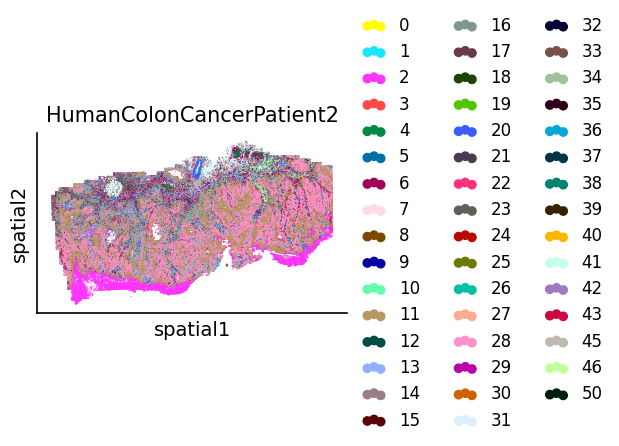

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


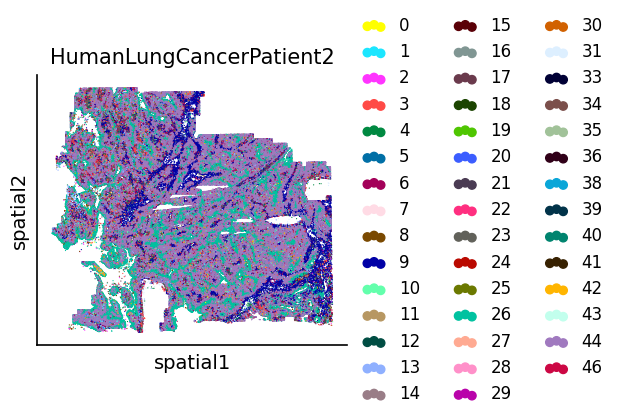

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


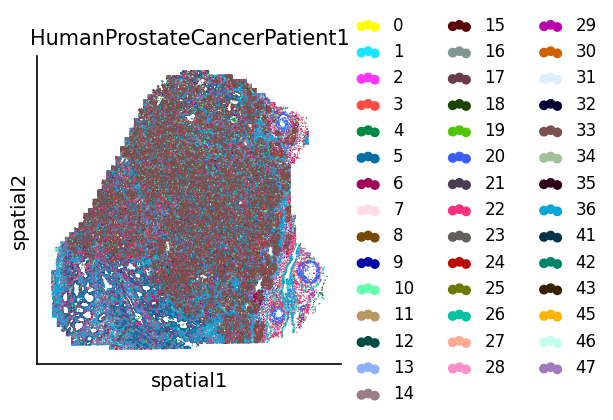

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


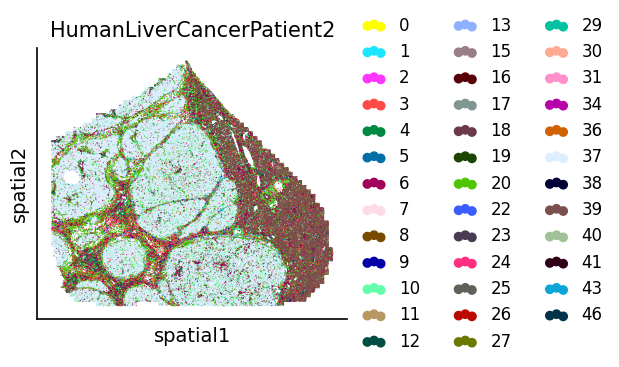

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


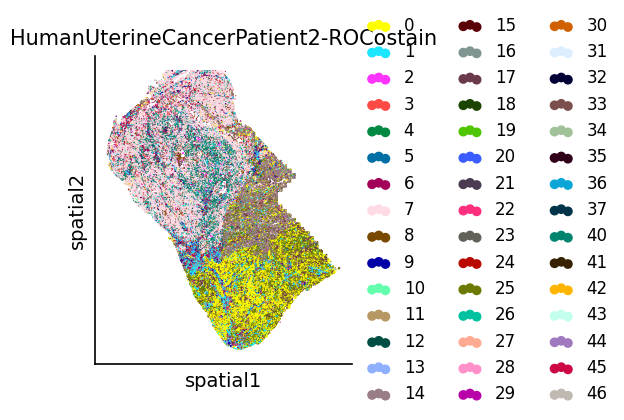

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


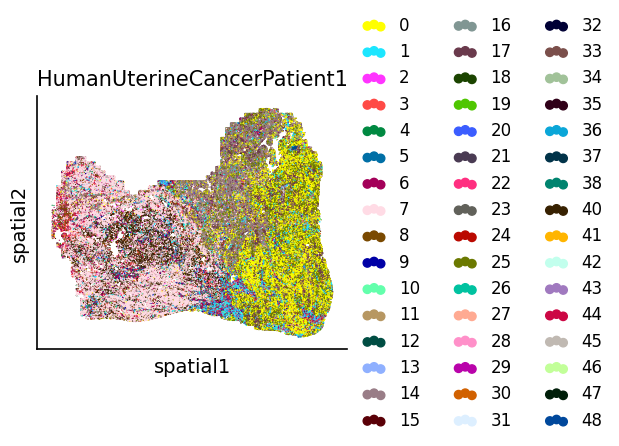

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


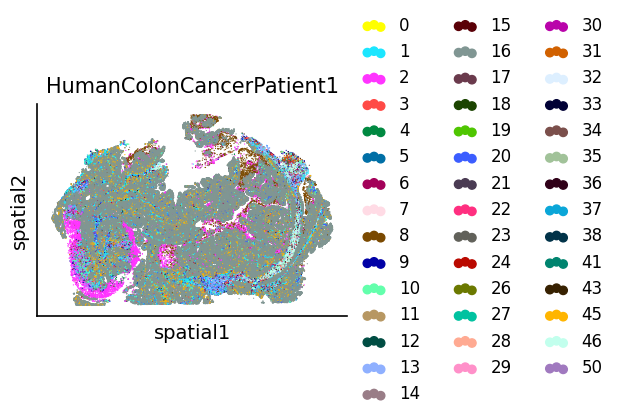

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


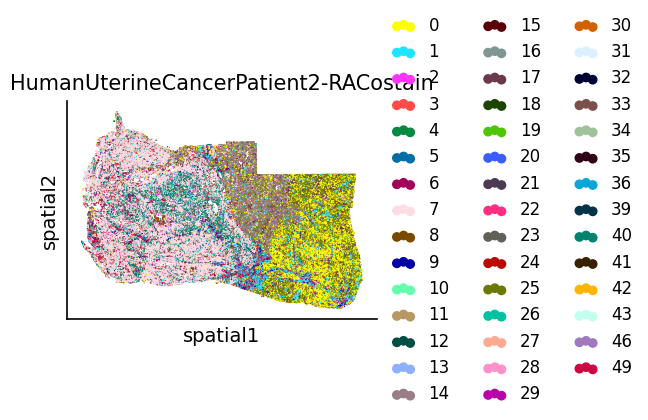

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


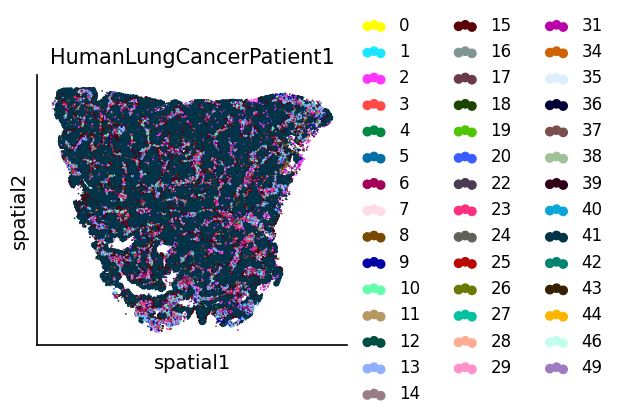

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


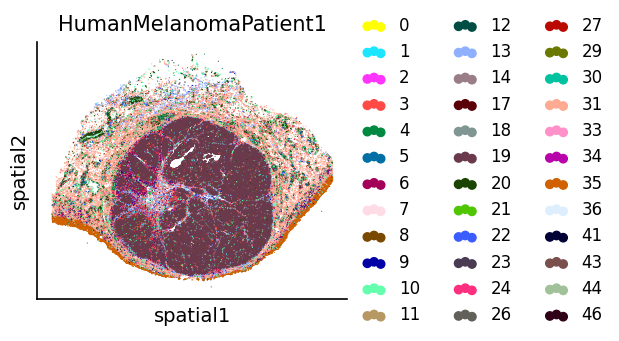

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


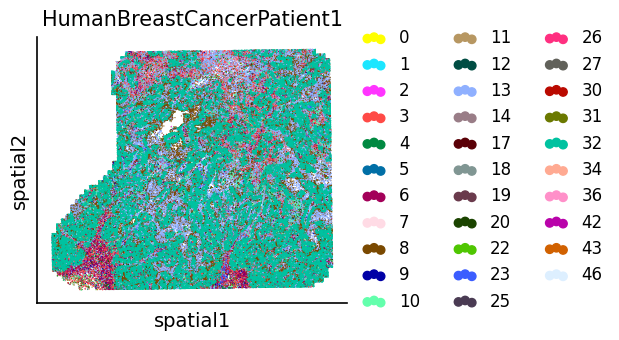

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


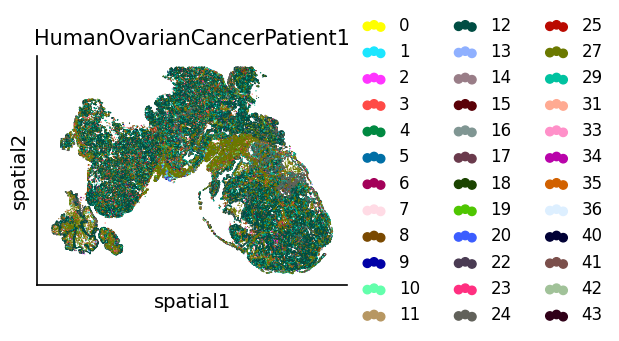

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


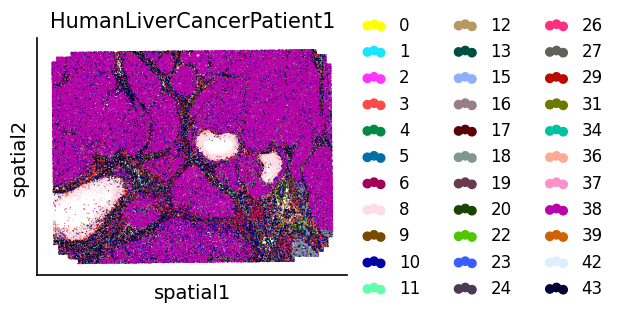

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


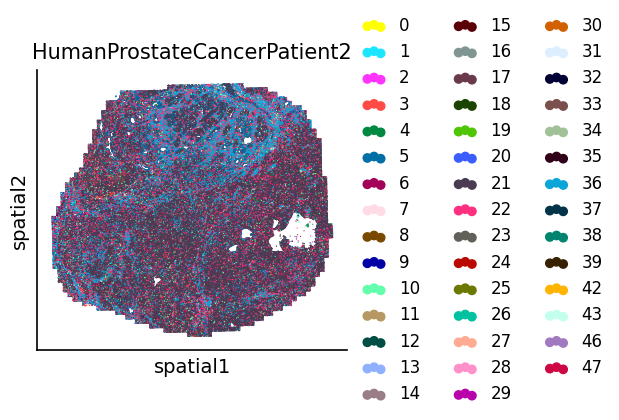

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


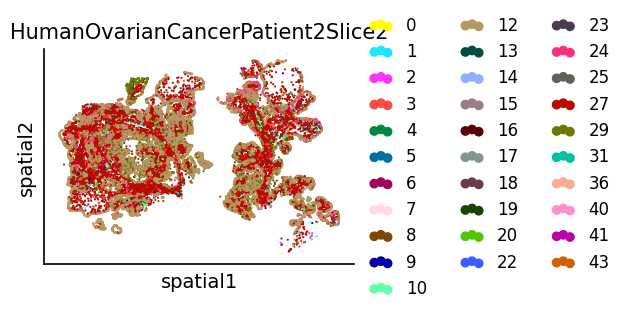

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


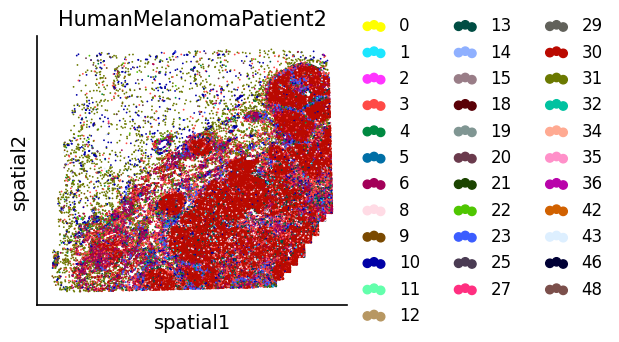

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


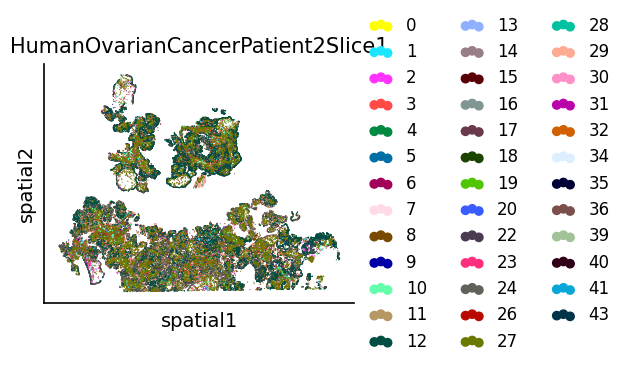

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


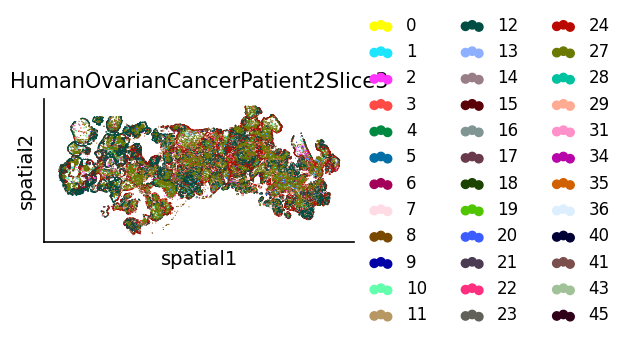

In [34]:
for i in proseg_concat.obs['patient'].unique():
    sc.pl.spatial(proseg_concat[proseg_concat.obs['patient']==i], color='louvain_final', spot_size=50, sort_order=False, title=i)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


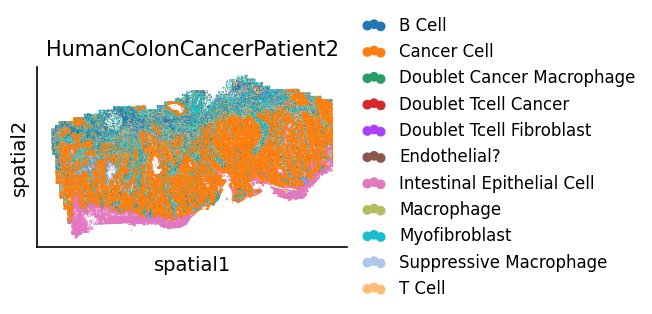

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


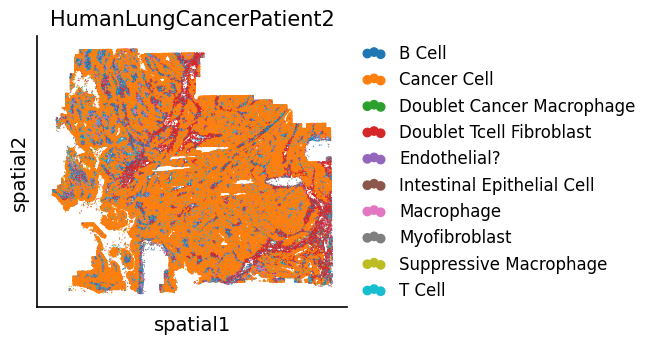

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


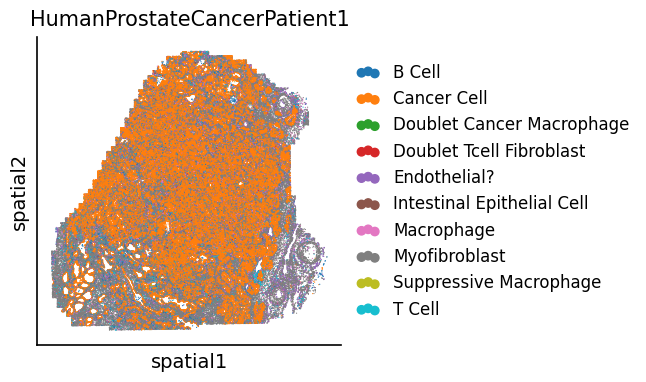

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


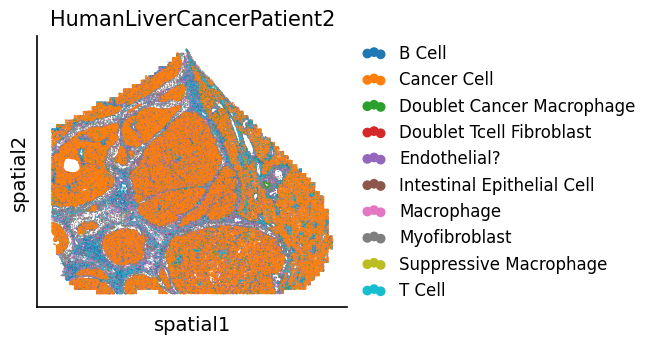

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


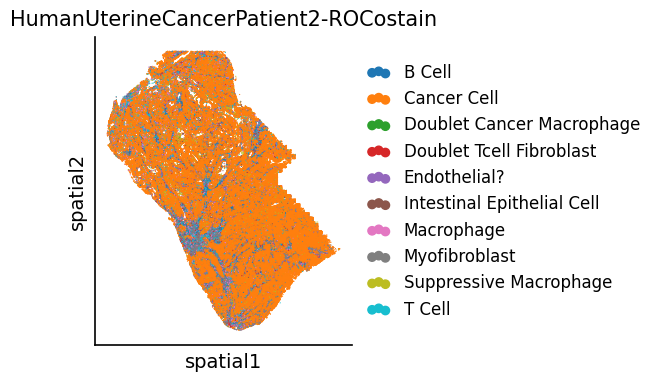

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


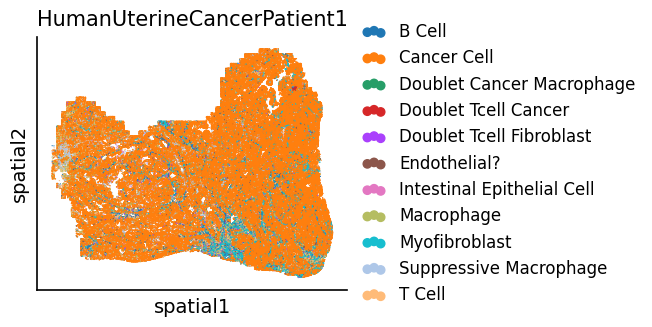

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


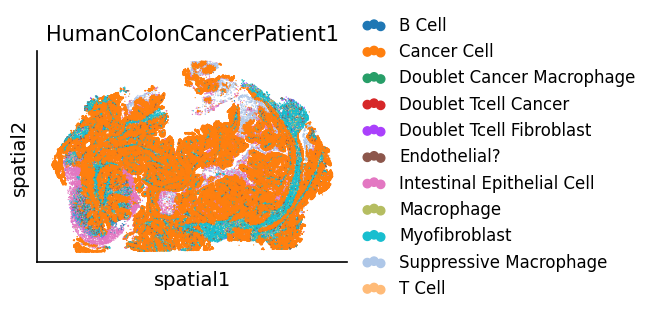

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


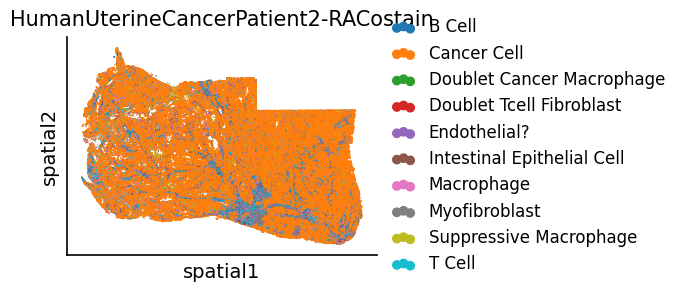

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


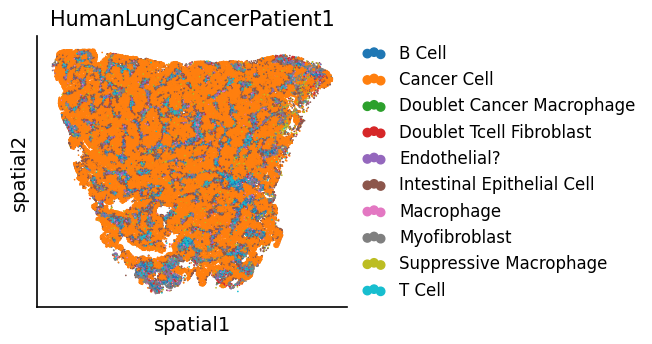

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


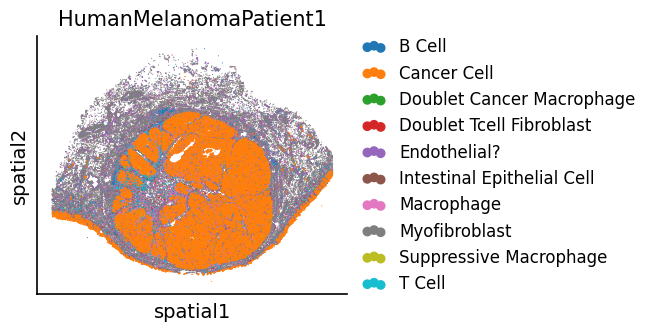

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


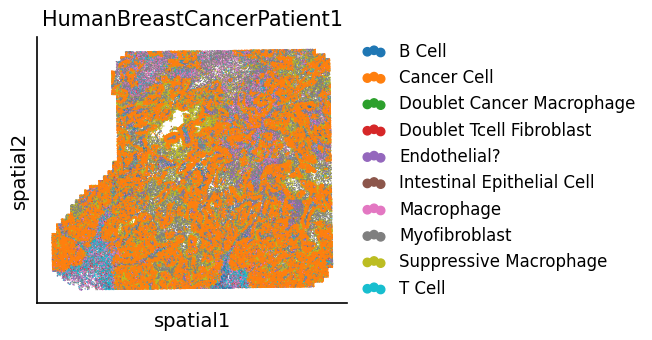

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


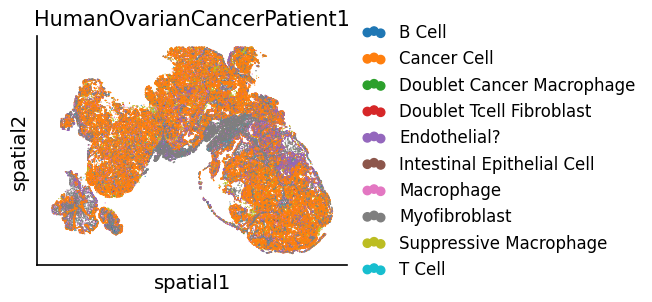

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


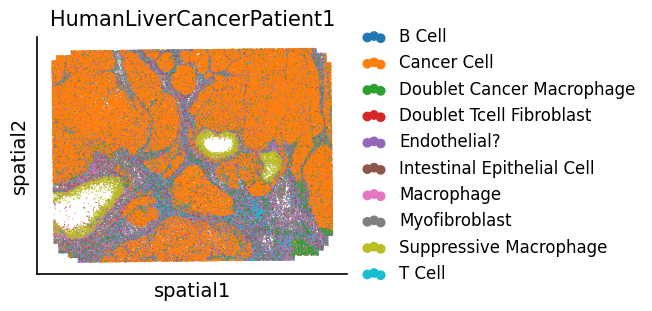

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


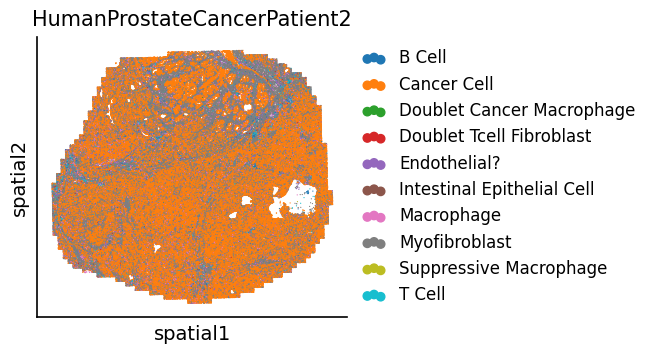

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


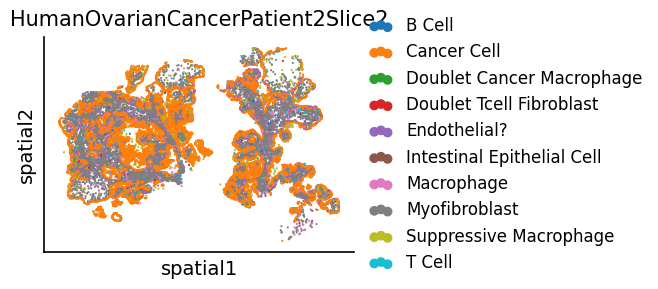

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


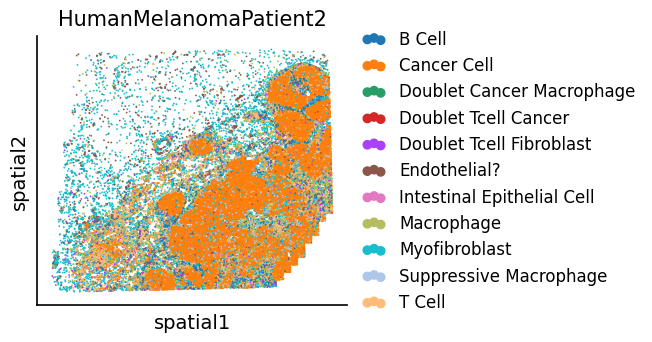

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


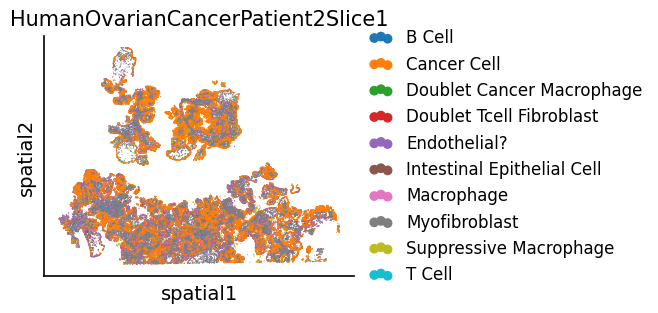

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


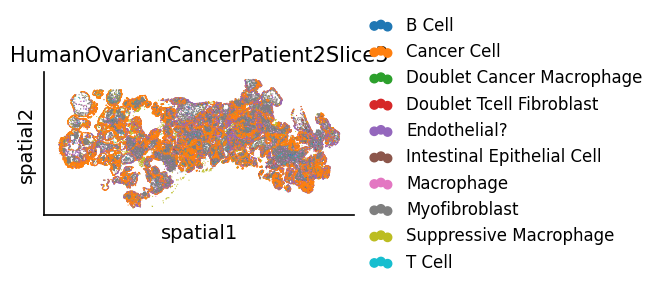

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


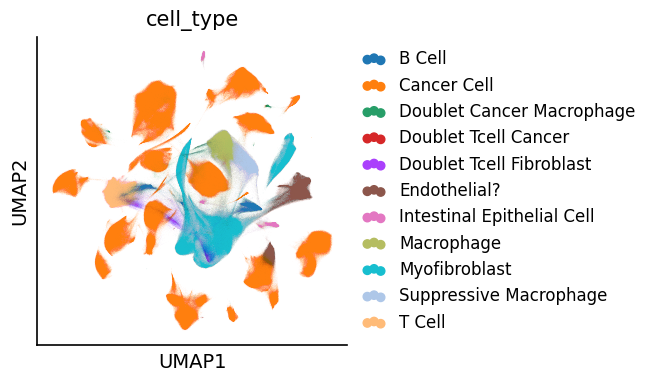

In [25]:
for i in proseg_concat.obs['patient'].unique():
    sc.pl.spatial(proseg_concat[proseg_concat.obs['patient']==i], color='cell_type', spot_size=50, sort_order=False, title=i)
sc.pl.umap(proseg_concat, color='cell_type', sort_order=False)

In [31]:
coarse_cell_type_mapping = {
    1: "Myofibroblast",
    44: "Cancer Cell",
    22: "Myofibroblast",
    37: "Cancer Cell",
    23: "B Cell",
    39: "Cancer Cell",
    17: "Cancer Cell",
    16: "Cancer Cell",
    13: "Myofibroblast",
    4: "B Cell",
    41: "Cancer Cell",
    25: "Cancer Cell",
    26: "Cancer Cell",
    3: "Macrophage",
    33: "Cancer Cell",
    19: "Cancer Cell",
    32: "Cancer Cell",
    8: "Suppressive Macrophage",
    38: "Cancer Cell",
    21: "Cancer Cell",
    14: "Cancer Cell",
    2: "Intestinal Epithelial Cell",
    0: "Cancer Cell",
    7: "Cancer Cell",
    6: "T Cell",
    12: "Cancer Cell",
    31: "Myofibroblast",
    36: "Myofibroblast",
    11: "Cancer Cell",
    30: "Cancer Cell",
    43: "Myofibroblast",
    24: "unassigned",
    29: "Cancer Cell",
    40: "Cancer Cell",
    10: "Endothelial",
    28: "Cancer Cell",
    5: "Cancer Cell",
    27: "Myofibroblast",
    35: "Skin Epithelial Cell",
    9: "unassigned",
    20: "Myofibroblast",
    34: "Suppressive Macrophage",
    42: "Cancer Cell",
    15: "Intestinal Epithelial Cell",
    46: "Myofibroblast",
    45: "Cancer Cell",
    18: "unassigned",
    47: "Cancer Cell",
    49: "Cancer Cell",
    50: "unassigned",
    48: "unassigned",
}
proseg_concat.obs['cell_type_coarse'] = proseg_concat.obs['louvain_final'].astype(int).map(coarse_cell_type_mapping)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


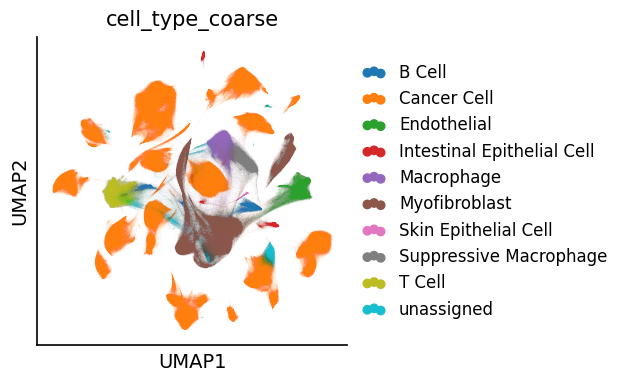

In [32]:
sc.pl.umap(proseg_concat, color='cell_type_coarse', sort_order=False)

In [35]:
proseg_concat.write('concat_subset_proseg_processed2.h5ad')

## Merge labelled cells

In [7]:
proseg_concat = sc.read_h5ad('concat_all_proseg.h5ad')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [8]:
proseg_concat_sub = sc.read('concat_subset_proseg_processed2.h5ad', backed='r')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [12]:
proseg_concat.obs_names = proseg_concat.obs['patient'].astype(str) + '__' + proseg_concat.obs_names.astype(str)
proseg_concat.obs

,transcript_id,x,y,z,observed_x,observed_y,observed_z,fov,probability,background,confusion,patient
HumanUterineCancerPatient2-RACostain__0,1.925343e+08,6589.782822,4344.866142,3.007944,6588.801597,4345.305614,2.932203,1078.0,0.636687,0.000000,0.084746,HumanUterineCancerPatient2-RACostain
HumanUterineCancerPatient2-RACostain__1,2.845774e+08,9183.271834,7900.014856,3.121728,9183.441269,7899.871672,3.088748,1455.0,0.575342,0.004754,0.074485,HumanUterineCancerPatient2-RACostain
HumanUterineCancerPatient2-RACostain__2,1.992586e+08,6899.655815,5099.306538,2.791694,6899.222012,5099.463760,2.806857,1111.0,0.606727,0.011429,0.054857,HumanUterineCancerPatient2-RACostain
HumanUterineCancerPatient2-RACostain__3,3.057446e+08,9726.442682,3816.838614,4.387189,9726.605295,3817.056077,4.590909,1542.0,0.414456,0.000000,0.136364,HumanUterineCancerPatient2-RACostain
HumanUterineCancerPatient2-RACostain__4,2.644650e+08,8742.278570,3982.434617,2.498376,8742.430672,3982.490163,2.442718,1378.0,0.617232,0.015534,0.078641,HumanUterineCancerPatient2-RACostain
...,...,...,...,...,...,...,...,...,...,...,...,...
HumanLiverCancerPatient1__475365,4.719760e+07,2705.916566,6125.151148,1.634037,2705.809087,6125.058628,1.548913,570.0,0.712083,0.059783,0.005435,HumanLiverCancerPatient1
HumanLiverCancerPatient1__475366,1.595240e+07,772.791605,2376.869434,1.780226,774.023605,2377.712193,1.862069,173.0,0.489315,0.103448,0.000000,HumanLiverCancerPatient1
HumanLiverCancerPatient1__475367,1.664137e+07,878.587802,3541.694496,2.897687,878.787833,3542.027422,3.017241,179.0,0.538092,0.034483,0.031609,HumanLiverCancerPatient1
HumanLiverCancerPatient1__475368,1.670295e+07,947.046630,3603.696000,4.572990,946.615800,3603.927000,3.000000,180.0,0.320010,0.000000,0.000000,HumanLiverCancerPatient1


In [13]:
proseg_concat_sub.obs_names = proseg_concat_sub.obs['patient'].astype(str) + '__' + proseg_concat_sub.obs_names.astype(str)
df = proseg_concat.obs.join(proseg_concat_sub.obs[['louvain', 'louvain_final', 'cell_type', 'cell_type_coarse']], rsuffix='_sub', how='left')

In [19]:
proseg_concat.obs = df
for col in proseg_concat.obs.select_dtypes(include=['category']).columns:
    try:
        proseg_concat.obs[col] = proseg_concat.obs[col].cat.add_categories('unassigned')
    except:
        pass
proseg_concat.obs = proseg_concat.obs.fillna('unassigned')

In [22]:
proseg_concat.obs

,transcript_id,x,y,z,observed_x,observed_y,observed_z,fov,probability,background,confusion,patient,louvain,louvain_final,cell_type,cell_type_coarse
HumanUterineCancerPatient2-RACostain__0,1.925343e+08,6589.782822,4344.866142,3.007944,6588.801597,4345.305614,2.932203,1078.0,0.636687,0.000000,0.084746,HumanUterineCancerPatient2-RACostain,0,0,Cancer Cell,Cancer Cell
HumanUterineCancerPatient2-RACostain__1,2.845774e+08,9183.271834,7900.014856,3.121728,9183.441269,7899.871672,3.088748,1455.0,0.575342,0.004754,0.074485,HumanUterineCancerPatient2-RACostain,25,25,Cancer Cell,Cancer Cell
HumanUterineCancerPatient2-RACostain__2,1.992586e+08,6899.655815,5099.306538,2.791694,6899.222012,5099.463760,2.806857,1111.0,0.606727,0.011429,0.054857,HumanUterineCancerPatient2-RACostain,unassigned,unassigned,unassigned,unassigned
HumanUterineCancerPatient2-RACostain__3,3.057446e+08,9726.442682,3816.838614,4.387189,9726.605295,3817.056077,4.590909,1542.0,0.414456,0.000000,0.136364,HumanUterineCancerPatient2-RACostain,unassigned,unassigned,unassigned,unassigned
HumanUterineCancerPatient2-RACostain__4,2.644650e+08,8742.278570,3982.434617,2.498376,8742.430672,3982.490163,2.442718,1378.0,0.617232,0.015534,0.078641,HumanUterineCancerPatient2-RACostain,unassigned,unassigned,unassigned,unassigned
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HumanLiverCancerPatient1__475365,4.719760e+07,2705.916566,6125.151148,1.634037,2705.809087,6125.058628,1.548913,570.0,0.712083,0.059783,0.005435,HumanLiverCancerPatient1,43,43,Myofibroblast,Myofibroblast
HumanLiverCancerPatient1__475366,1.595240e+07,772.791605,2376.869434,1.780226,774.023605,2377.712193,1.862069,173.0,0.489315,0.103448,0.000000,HumanLiverCancerPatient1,unassigned,unassigned,unassigned,unassigned
HumanLiverCancerPatient1__475367,1.664137e+07,878.587802,3541.694496,2.897687,878.787833,3542.027422,3.017241,179.0,0.538092,0.034483,0.031609,HumanLiverCancerPatient1,unassigned,unassigned,unassigned,unassigned
HumanLiverCancerPatient1__475368,1.670295e+07,947.046630,3603.696000,4.572990,946.615800,3603.927000,3.000000,180.0,0.320010,0.000000,0.000000,HumanLiverCancerPatient1,unassigned,unassigned,unassigned,unassigned


In [20]:
proseg_concat.write_h5ad('concat_all_proseg_processed.h5ad')

## Downstream

In [7]:
model_path = '/data/extra_files/Vizgen_redownload/resolvi/resolvae'
resolvi_semisupervised = RESOLVI.load(model_path)

INFO     File /data/extra_files/Vizgen_redownload/resolvi/resolvae/model.pt already downloaded                     


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [ ]:
2

2

In [ ]:
proseg = resolvi_semisupervised.adata

In [ ]:
proseg.obsm['celltype_transfer'] = resolvi_semisupervised.predict(soft=True, num_samples=1, batch_size=30000)
proseg.obs['predicted_celltype'] = proseg.obsm['celltype_transfer'].idxmax(axis=1)
proseg.obs['predicted_celltype_prob'] = proseg.obsm['celltype_transfer'].max(axis=1)

Sampling macro-batches, batch:   0%|          | 0/208 [00:00<?, ?it/s]

Sampling macro-batches, batch:  52%|█████▏    | 109/208 [47:24<2:02:22, 74.16s/it]

In [ ]:
proseg.obsm['X_resolvi'] = resolvi_semisupervised.get_latent_representation()

In [ ]:
proseg.write_h5ad('concat_all_proseg_resolvi.h5ad')

OSError: [Errno 28] Write through metadata accumulator failed (file write failed: time = Mon Jul  8 05:20:24 2024
, filename = 'concat_all_proseg_resolvi.h5ad', file descriptor = 141, errno = 28, error message = 'No space left on device', buf = 0x55ebd0883e28, total write size = 232992, bytes this sub-write = 232992, bytes actually written = 18446744073709551615, offset = 0)

In [ ]:
for i in proseg.obs['patient'].unique():
    sc.pl.spatial(proseg[proseg.obs['patient']==i], color='predicted_celltype', spot_size=50, sort_order=False, title=i)